In [1]:
# BASE
# ------------------------------------------------------
import numpy as np
import pandas as pd
import os
import gc
import warnings

#!pip install xgboost
import sklearn
from sklearn import linear_model
from sklearn.linear_model  import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler

# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm

# DATA VISUALIZATION
# ------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# CONFIGURATIONS
# ------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')
folder = 'C:/Users/eflanag/OneDrive - FTI Consulting/Documents/Projects/Ibex_EF/IbexV2/ibexgit/kaggle-store-sales/data/'



In [2]:
# Import
train = pd.read_csv(folder+"train.csv")
test = pd.read_csv(folder+"test.csv")
stores = pd.read_csv(folder+"stores.csv")
#sub = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")   
transactions = pd.read_csv(folder+"transactions.csv").sort_values(["store_nbr", "date"])


# Datetime
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)

# Data types
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00


In [3]:

temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8175


In [4]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

In [5]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")


In [6]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

In [7]:
# Import 
oil = pd.read_csv(folder+"/oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

Correlation with Daily Oil Prices
sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolated, dtype: float64 



Text(0.5, 1.0, 'Daily Oil Price & Sales')

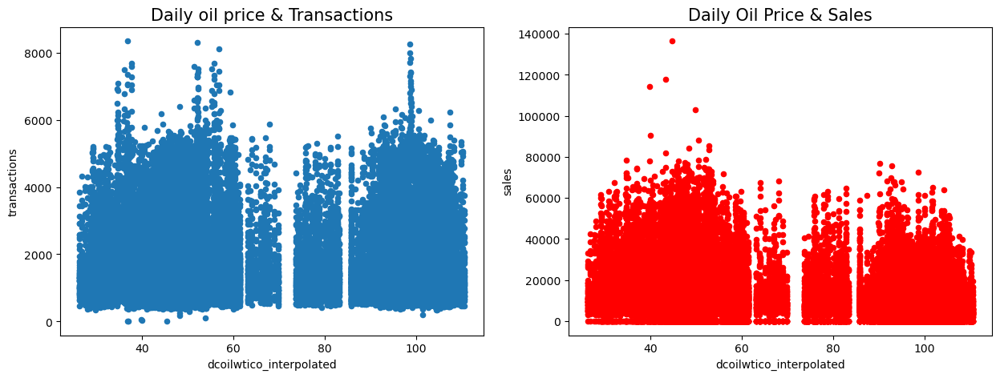

In [8]:
temp = pd.merge(temp, oil, how = "left")
print("Correlation with Daily Oil Prices")
print(temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolated.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "transactions", ax=axes[0])
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Daily oil price & Transactions', fontsize = 15)
axes[1].set_title('Daily Oil Price & Sales', fontsize = 15)

In [9]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

0 HOME AND KITCHEN II
1 MAGAZINES
2 HOME AND KITCHEN I
3 SCHOOL AND OFFICE SUPPLIES
4 PET SUPPLIES
5 BABY CARE
6 BEVERAGES
7 CELEBRATION
8 PLAYERS AND ELECTRONICS
9 HOME CARE
10 PRODUCE
11 BEAUTY
12 DAIRY
13 BREAD/BAKERY
14 LADIESWEAR
15 DELI
16 GROCERY I
17 PERSONAL CARE
18 LAWN AND GARDEN
19 AUTOMOTIVE
20 CLEANING
21 PREPARED FOODS
22 HARDWARE
23 POULTRY
24 FROZEN FOODS
25 EGGS
26 SEAFOOD
27 GROCERY II
28 BOOKS
29 LIQUOR,WINE,BEER
30 MEATS
31 HOME APPLIANCES
32 LINGERIE


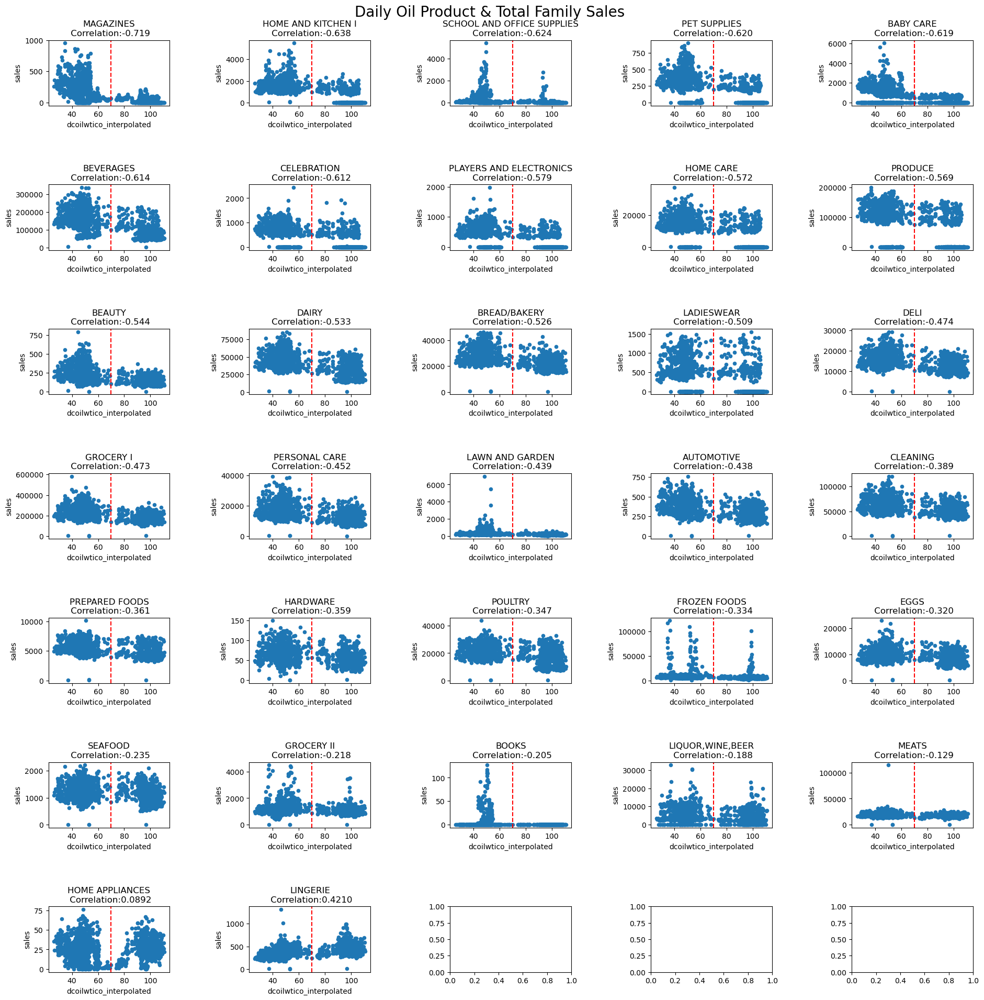

In [10]:

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    print(i, fam)
    # if i < 6:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
    #     axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    # if i >= 6 and i<11:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
    #     axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    # if i >= 11 and i<16:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
    #     axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    # if i >= 16 and i<21:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
    #     axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    # if i >= 21 and i<26:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
    #     axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    # if i >= 26 and i < 31:
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
    #     axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    # if i >= 31 :
    #     a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
    #     axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
    #     axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()

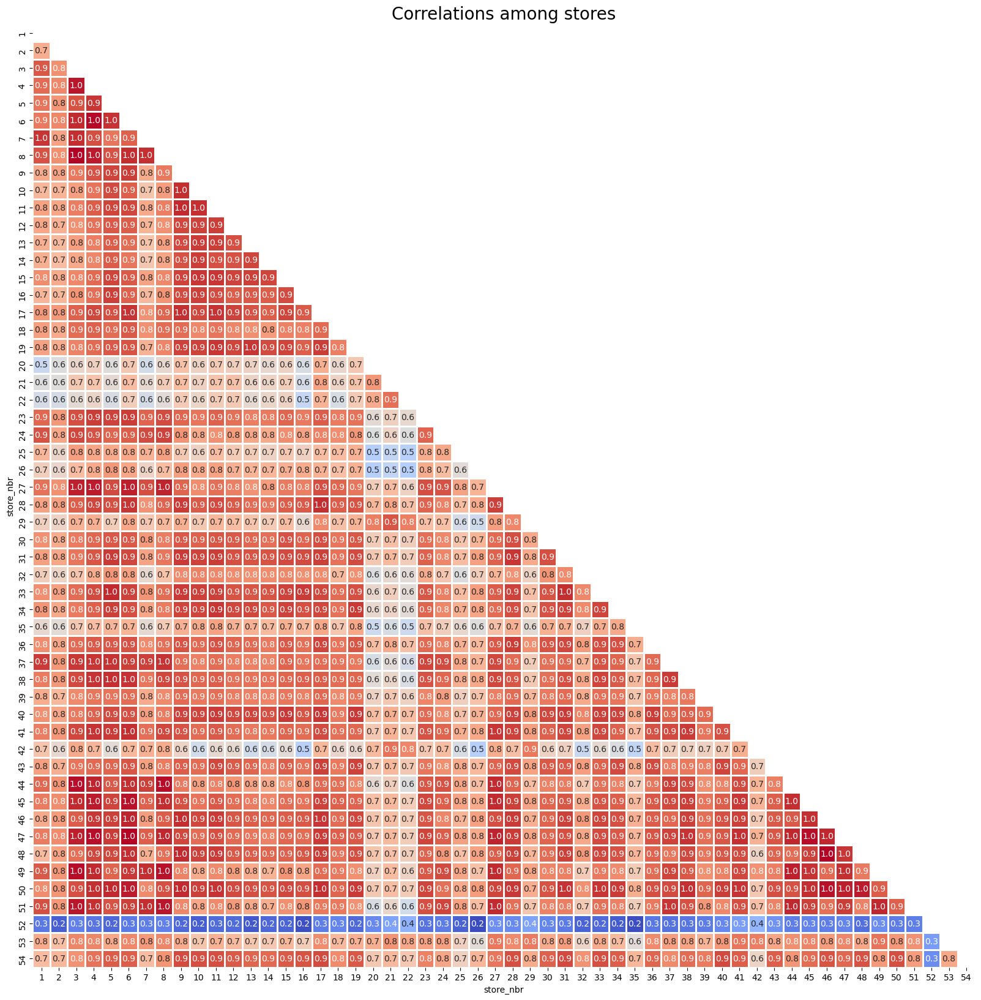

In [11]:
a = train[["store_nbr", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_nbr").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()

In [12]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train.shape

(3000888, 6)


(2780316, 6)

In [13]:
c = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.00
397,13,BABY CARE,0.00
727,23,BABY CARE,0.00
1420,44,BABY CARE,0.00
1453,45,BABY CARE,0.00
1486,46,BABY CARE,0.00
1519,47,BABY CARE,0.00
1552,48,BABY CARE,0.00
1585,49,BABY CARE,0.00
1618,50,BABY CARE,0.00


In [14]:
print(train.shape)
# Anti Join
outer_join = train.merge(c[c.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
train.shape

(2780316, 6)


(2698648, 6)

In [15]:
zero_prediction = []
for i in range(0,len(c)):
    zero_prediction.append(
        pd.DataFrame({
            "date":pd.date_range("2017-08-16", "2017-08-31").tolist(),
            "store_nbr":c.store_nbr.iloc[i],
            "family":c.family.iloc[i],
            "sales":0
        })
    )
zero_prediction = pd.concat(zero_prediction)
del c
gc.collect()
zero_prediction

,date,store_nbr,family,sales
0,2017-08-16,1,BABY CARE,0
1,2017-08-17,1,BABY CARE,0
2,2017-08-18,1,BABY CARE,0
3,2017-08-19,1,BABY CARE,0
4,2017-08-20,1,BABY CARE,0
...,...,...,...,...
11,2017-08-27,54,LAWN AND GARDEN,0
12,2017-08-28,54,LAWN AND GARDEN,0
13,2017-08-29,54,LAWN AND GARDEN,0
14,2017-08-30,54,LAWN AND GARDEN,0


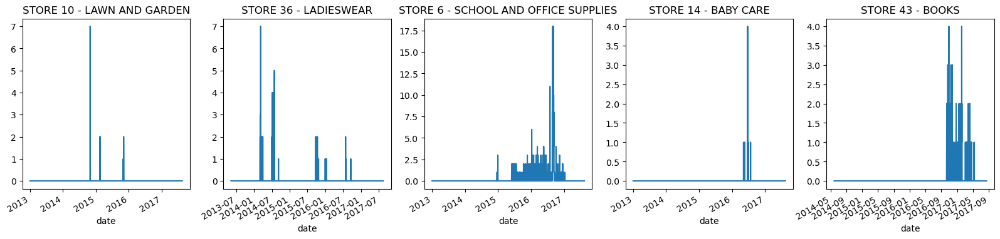

In [16]:
fig, ax = plt.subplots(1,5, figsize = (20,4))
train[(train.store_nbr == 10) & (train.family == "LAWN AND GARDEN")].set_index("date").sales.plot(ax = ax[0], title = "STORE 10 - LAWN AND GARDEN")
train[(train.store_nbr == 36) & (train.family == "LADIESWEAR")].set_index("date").sales.plot(ax = ax[1], title = "STORE 36 - LADIESWEAR")
train[(train.store_nbr == 6) & (train.family == "SCHOOL AND OFFICE SUPPLIES")].set_index("date").sales.plot(ax = ax[2], title = "STORE 6 - SCHOOL AND OFFICE SUPPLIES")
train[(train.store_nbr == 14) & (train.family == "BABY CARE")].set_index("date").sales.plot(ax = ax[3], title = "STORE 14 - BABY CARE")
train[(train.store_nbr == 53) & (train.family == "BOOKS")].set_index("date").sales.plot(ax = ax[4], title = "STORE 43 - BOOKS")
plt.show()


In [17]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [18]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

In [19]:
print("Spearman Correlation between Sales and Onpromotion: {:,.4f}".format(train.corr("spearman").sales.loc["onpromotion"]))

Spearman Correlation between Sales and Onpromotion: 0.5304


In [20]:
holidays = pd.read_csv(folder+"holidays_events.csv")
holidays["date"] = pd.to_datetime(holidays.date)
holidays


# holidays[holidays.type == "Holiday"]
# holidays[(holidays.type == "Holiday") & (holidays.transferred == True)]

# Transferred Holidays
tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

tr

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
holidays = holidays.append(tr).reset_index(drop = True)


# Additional Holidays
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Bridge Holidays
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])

 
# Work Day Holidays, that is meant to payback the Bridge.
work_day = holidays[holidays.type == "Work Day"]  
holidays = holidays[holidays.type != "Work Day"]  


# Split

# Events are national
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()

test['test/train'] = 'test'
train['test/train'] = 'train'


d = pd.merge(train.append(test), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# National Holidays & Events
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regional
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Local
d = pd.merge(d, local, how = "left", on = ["date", "city"])


# Work Day: It will be removed when real work day colum created
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")



# EVENTS
events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)



# New features
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

# 
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)


print(d[d['test/train'] == 'test'])

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["test/train","family", "city", "state", "type"]] = d[["test/train","family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()
print(d.tail())

#d.head(5)

              id       date  store_nbr                      family  sales  \
53888    3000888 2017-08-16          1                  AUTOMOTIVE    NaN   
53889    3000889 2017-08-16          1                   BABY CARE    NaN   
53890    3000890 2017-08-16          1                      BEAUTY    NaN   
53891    3000891 2017-08-16          1                   BEVERAGES    NaN   
53892    3000892 2017-08-16          1                       BOOKS    NaN   
...          ...        ...        ...                         ...    ...   
2727155  3029197 2017-08-31         52                     POULTRY    NaN   
2727156  3029198 2017-08-31         52              PREPARED FOODS    NaN   
2727157  3029199 2017-08-31         52                     PRODUCE    NaN   
2727158  3029200 2017-08-31         52  SCHOOL AND OFFICE SUPPLIES    NaN   
2727159  3029201 2017-08-31         52                     SEAFOOD    NaN   

         onpromotion test/train   city      state type  cluster IsWorkDay  

In [21]:
d.dtypes
d.dtypes
#d["date"]

id                                                   int64
date                                        datetime64[ns]
store_nbr                                             int8
family                                            category
sales                                              float32
                                                 ...      
holiday_local_Fundacion_de_Riobamba                   int8
holiday_local_Fundacion_de_Santo_Domingo              int8
holiday_local_Independencia_de_Ambato                 int8
holiday_local_Independencia_de_Guaranda               int8
holiday_local_Independencia_de_Latacunga              int8
Length: 62, dtype: object

In [22]:
def get_date_data():
    global test, train
    holidays = pd.read_csv(folder+"holidays_events.csv")
    holidays["date"] = pd.to_datetime(holidays.date)
    holidays


    # holidays[holidays.type == "Holiday"]
    # holidays[(holidays.type == "Holiday") & (holidays.transferred == True)]

    # Transferred Holidays
    tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
    tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
    tr = pd.concat([tr1,tr2], axis = 1)
    tr = tr.iloc[:, [5,1,2,3,4]]

    tr

    holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
    holidays = holidays.append(tr).reset_index(drop = True)


    # Additional Holidays
    holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
    holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

    # Bridge Holidays
    holidays["description"] = holidays["description"].str.replace("Puente ", "")
    holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])


    # Work Day Holidays, that is meant to payback the Bridge.
    work_day = holidays[holidays.type == "Work Day"]  
    holidays = holidays[holidays.type != "Work Day"]  


    # Split

    # Events are national
    events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

    holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
    regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
    national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
    local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()

    test['test/train'] = 'test'
    train['test/train'] = 'train'


    d = pd.merge(train.append(test), stores)
    d["store_nbr"] = d["store_nbr"].astype("int8")


    # National Holidays & Events
    #d = pd.merge(d, events, how = "left")
    d = pd.merge(d, national, how = "left")
    # Regional
    d = pd.merge(d, regional, how = "left", on = ["date", "state"])
    # Local
    d = pd.merge(d, local, how = "left", on = ["date", "city"])


    # Work Day: It will be removed when real work day colum created
    d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")

    # EVENTS
    events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

    def one_hot_encoder(df, nan_as_category=True):
        original_columns = list(df.columns)
        categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
        # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
        df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
        new_columns = [c for c in df.columns if c not in original_columns]
        df.columns = df.columns.str.replace(" ", "_")
        return df, df.columns.tolist()

    events, events_cat = one_hot_encoder(events, nan_as_category=False)
    events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
    events = events.drop(239)

    d = pd.merge(d, events, how = "left")
    d[events_cat] = d[events_cat].fillna(0)



    # New features
    d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
    d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
    d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

    # 
    d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
    d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
    d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
    d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


    holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
    d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)



    he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
    d[he_cols] = d[he_cols].astype("int8")

    d[["test/train","family", "city", "state", "type"]] = d[["test/train","family", "city", "state", "type"]].astype("category")

    del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
    gc.collect()
    return d

#d.head(5)

In [23]:
# def AB_Test(dataframe, group, target): # data, columun, sales
    
#     # Packages
#     from scipy.stats import shapiro
#     import scipy.stats as stats
#     # Split A/B
#     groupA = dataframe[dataframe[group] == 1][target]
#     groupB = dataframe[dataframe[group] == 0][target]
    
#     print(shapiro(groupA)[1])
#     print(shapiro(groupB)[1])

#     # Assumption: Normality
#     ntA = shapiro(groupA)[1] < 0.05
#     ntB = shapiro(groupB)[1] < 0.05
#     # H0: Distribution is Normal! - False
#     # H1: Distribution is not Normal! - True
    
#     if (ntA == False) & (ntB == False): # "H0: Normal Distribution"
#         # Parametric Test
#         # Assumption: Homogeneity of variances
#         print('# Parametric Test')
#         leveneTest = stats.levene(groupA, groupB)[1] < 0.05
#         # H0: Homogeneity: False
#         # H1: Heterogeneous: True
        
#         if leveneTest == False:
#             # Homogeneity
#             print('# Homogeneity')

#             ttest = stats.ttest_ind(groupA, groupB, equal_var=True)[1]
#             # H0: M1 == M2 - False
#             # H1: M1 != M2 - True
#         else:
#             # Heterogeneous
#             print('# Heterogeneous')
#             ttest = stats.ttest_ind(groupA, groupB, equal_var=False)[1]
#             # H0: M1 == M2 - False
#             # H1: M1 != M2 - True
#     else:
#         # Non-Parametric Test
#         print('# Non-Parametric Test')

#         ttest = stats.mannwhitneyu(groupA, groupB)[1] 
#         # H0: M1 == M2 - False
#         # H1: M1 != M2 - True
        
#     # Result
#     temp = pd.DataFrame({
#         "AB Hypothesis":[ttest < 0.05], 
#         "p-value":[ttest]
#     })
#     #print('tempstart \n')
#     #print(temp)
#     #print('tempover \n')

#     temp["Test Type"] = np.where((ntA == False) & (ntB == False), "Parametric", "Non-Parametric")
#     temp["AB Hypothesis"] = np.where(temp["AB Hypothesis"] == False, "Fail to Reject H0", "Reject H0")
#     temp["Comment"] = np.where(temp["AB Hypothesis"] == "Fail to Reject H0", "A/B groups are similar!", "A/B groups are not similar!")
#     temp["Feature"] = group
#     temp["GroupA_mean"] = groupA.mean()
#     temp["GroupB_mean"] = groupB.mean()
#     temp["GroupA_median"] = groupA.median()
#     temp["GroupB_median"] = groupB.median()
    
#     # Columns
#     if (ntA == False) & (ntB == False):
#         temp["Homogeneity"] = np.where(leveneTest == False, "Yes", "No")
#         temp = temp[["Feature","Test Type", "Homogeneity","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
#     else:
#         temp = temp[["Feature","Test Type","AB Hypothesis", "p-value", "Comment", "GroupA_mean", "GroupB_mean", "GroupA_median", "GroupB_median"]]
    
#     # Print Hypothesis
#     # print("# A/B Testing Hypothesis")
#     # print("H0: A == B")
#     # print("H1: A != B", "\n")
    
#     return temp
    
# # Apply A/B Testing
# he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() \
#         + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
# ab = []
# for i in he_cols:
#     print(i)
#     ab.append(AB_Test(dataframe=d[d.sales.notnull()], group = i, target = "sales"))
# ab = pd.concat(ab)
# ab

In [24]:
d.groupby(["family","events_Futbol"]).sales.mean()[:60]

family                   events_Futbol
AUTOMOTIVE               0                  6.59
                         1                  6.20
BABY CARE                0                  0.15
                         1                  0.09
BEAUTY                   0                  4.02
                         1                  2.89
BEVERAGES                0               2577.73
                         1               2243.45
BOOKS                    0                  0.15
                         1                  0.00
BREAD/BAKERY             0                500.48
                         1                451.53
CELEBRATION              0                  9.06
                         1                  6.43
CLEANING                 0               1157.94
                         1               1102.08
DAIRY                    0                765.46
                         1                759.26
DELI                     0                286.35
                         1    

In [25]:
# Time Related Features
def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    #df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_month'] = ((df['day_of_month']-1) // 7 + 1).astype("int8")


    df['week_of_year'] = (df.date.dt.weekofyear).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df
#d["date"] = pd.to_datetime(d.date, errors='coerce')
#d = d.dropna()
d = get_date_data()

d = create_date_features(d)




# Workday column
d["workday"] = np.where((d.holiday_national_binary == 1) | (d.holiday_local_binary==1) | (d.holiday_regional_binary==1) | (d['day_of_week'].isin([6,7])), 0, 1)
d["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, d["workday"])).astype("int8")
d.drop("IsWorkDay", axis = 1, inplace = True)

# Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. 
# Supermarket sales could be affected by this.
d["wageday"] = pd.Series(np.where((d['is_month_end'] == 1) | (d["day_of_month"] == 15), 1, 0)).astype("int8")

d.tail(15)
d.shape

(2727160, 79)

In [26]:
d.dtypes
#d["date"]

id                        int64
date             datetime64[ns]
store_nbr                  int8
family                 category
sales                   float32
                      ...      
is_year_start              int8
is_year_end                int8
season                     int8
workday                    int8
wageday                    int8
Length: 79, dtype: object

In [27]:
d[d['test/train'] == 'train']

,id,date,store_nbr,family,sales,onpromotion,test/train,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,train,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,train,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,1,3,2013,0,1,0,0,0,0,0,0,0,1,0
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,train,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,1,4,2013,0,1,0,0,0,0,0,0,0,1,0
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,train,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,1,5,2013,1,1,0,0,0,0,0,0,0,1,0
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,train,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5,5,1,1,6,2013,1,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2726627,2993561,2017-08-11,52,SEAFOOD,23.00,3.00,train,Manta,Manabi,A,11,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,11,223,2,32,5,2017,1,3,0,0,0,0,0,0,2,0,0
2726628,2995343,2017-08-12,52,SEAFOOD,5.00,0.00,train,Manta,Manabi,A,11,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,12,224,2,32,6,2017,1,3,0,0,0,0,0,0,2,0,0
2726629,2997125,2017-08-13,52,SEAFOOD,12.00,0.00,train,Manta,Manabi,A,11,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,13,225,2,32,7,2017,1,3,0,0,0,0,0,0,2,0,0
2726630,2998907,2017-08-14,52,SEA

In [28]:
dFull = d
d = dFull.sample(frac=0.05, replace=True, random_state=1)
d.shape

(136358, 79)

In [29]:
dataTrainTestHold = d

cols = ['test/train' ,'sales', 'family', 'date', 'month','day_of_month', 'week_of_year','day_of_week']
dataTrainTest = dataTrainTestHold[cols]

dataTrain = dataTrainTest[dataTrainTest['test/train'] ==  'train'].reset_index(drop=True)
dataTest = dataTrainTest[dataTrainTest['test/train'] ==  'test'].reset_index(drop=True)

dataTrain




,test/train,sales,family,date,month,day_of_month,week_of_year,day_of_week
0,train,4595.04,GROCERY I,2014-11-14,11,14,46,5
1,train,903.00,BREAD/BAKERY,2013-11-24,11,24,47,7
2,train,127.00,FROZEN FOODS,2014-07-12,7,12,28,6
3,train,3826.00,BEVERAGES,2017-03-04,3,4,9,6
4,train,8.00,GROCERY II,2013-02-11,2,11,7,1
...,...,...,...,...,...,...,...,...
134902,train,6.00,LADIESWEAR,2015-07-02,7,2,27,4
134903,train,25.00,EGGS,2016-01-13,1,13,2,3
134904,train,261.27,MEATS,2016-12-14,12,14,50,3
134905,train,19.00,AUTOMOTIVE,2015-05-03,5,3,18,7


In [30]:
# Separate data into train and test sets
#train, test = tts(model_df)
train_ = (dataTrain)
test_ = (dataTest)

#family_encoded = pd.get_dummies(dataTrain['family'], prefix='family')
#dataTrain = pd.concat([dataTrain, family_encoded], axis=1)
#dataTrain.drop('family', axis=1, inplace=True)


dataTrain.drop('family', axis=1, inplace=True)

train_, test_ = train_test_split(dataTrain.dropna().reset_index(drop=True), test_size=0.2, random_state=42)

In [31]:
print(train_['sales'][train_['sales'] <= 0] )

61634    0.00
81407    0.00
129269   0.00
132047   0.00
127859   0.00
         ... 
130523   0.00
122537   0.00
84478    0.00
5311     0.00
64925    0.00
Name: sales, Length: 25430, dtype: float32


In [32]:
#!pip install xgboost
import sklearn
from sklearn import linear_model
from sklearn.linear_model  import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
pd.set_option('display.max_colwidth', None)

def predict_test(test_data, model):
    return model.predict(test_data)


model_metrics_full = []
metrics_df = pd.DataFrame(columns=['Model', 'cols', 'MAE', 'MSE', 'RMSE','RMSLE', 'R2'])

X_train = 0
y_train = 0
X_test = 0
y_test = 0
y_pred = 0

def regressive_model(train_data, test_data, model, model_name):
    global metrics_df, X_train,y_train, X_test, y_test, y_pred
    model_metrics = {}
    # Call helper functions to create X & y and scale data
    #X_train, y_train, X_test, y_test, scaler_object =  scale_data(train_data, test_data)


    X_train = train_data.drop(['sales','date', 'test/train'], axis=1) 
    y_train = train_data.sales 

    X_test = test_data.drop(['sales','date', 'test/train'], axis=1) 
    y_test = test_data.sales


    scaler = MinMaxScaler()

    #for col in X_train.columns:
    #    X_train[col] = scaler.fit_transform(X_train[[col]])
    #    X_test[col] = scaler.fit_transform(X_test[[col]])
    

    #scaler.fit(X_train)
    #scaler.transform(X_test)

     # Run regression model
    mod = model
    mod.fit(X_train, y_train)
    X_train_ped =  mod.predict(X_train)
    X_train_ped[X_train_ped < 0] = 0
    X_train['y_pred'] = X_train_ped
    X_train['sales'] = y_train
    X_train['pred_diff'] = abs(X_train['sales'] - X_train['y_pred'])
    X_train['pred_diff_%'] = round(X_train['y_pred'] / X_train['sales'], 2)
    y_pred = mod.predict(X_test)
    print(X_train.shape)
    
    min_value = min(min(y_test), min(y_pred))
    y_test_transformed = y_test - min_value + 1
    y_pred_transformed = y_pred - min_value + 1

    y_pred[y_pred < 0] = 0

    X_test['y_pred'] = y_pred

    if (y_pred < 0).any():
        rmsle = 9999999

    else:    
        rmsle = np.sqrt(mean_squared_log_error(y_test, y_pred))


    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    #rmsle = np.sqrt(mean_squared_log_error(y_test_transformed, y_pred_transformed))

    r2 = r2_score(y_test, y_pred)

    print('Columns:',list(X_train.columns))
    print(f'MAE: {mae:.2f}')
    print(f'MSE: {mse:.2f}')
    print(f'RMSE: {rmse:.2f}')
    print(f'RMSLE: {rmsle:.2f}')
    print(f'R2 score: {r2:.2f}')

    model_metrics[model_name] = {
        'Columns': (X_train.columns.values),
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2 score': r2
    }
    model_metrics_full.append(model_metrics) 
    metrics_df = metrics_df.append({'Model': model_name, 'cols': list(X_train.columns),  'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'RMSLE': rmsle, 'R2': r2}, ignore_index=True)


    '''
    #plt.scatter(y_pred, y_test, alpha=0.5)
    #plt.scatter(X_train, y_train,color='g') 
    plt.plot(X_test, y_pred,color='k') 

    plt.xlabel('Actual Sales')
    plt.ylabel('Predicted Sales')
    plt.title('Linear Regression Model')
    plt.show() 
    '''
    return model


# Call model frame work for linear regression


In [33]:
model = regressive_model(train_, test_, LinearRegression(),'LinearRegression')

(107925, 8)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 563.02
MSE: 1421821.77
RMSE: 1192.40
RMSLE: 3.79
R2 score: 0.00


In [34]:
# Call model frame work for random forest regressor 
model = regressive_model(train_, test_, 
                 RandomForestRegressor(n_estimators=100,
                                       max_depth=10),        
                                       'RandomForest')

(107925, 8)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 562.59
MSE: 1420167.88
RMSE: 1191.71
RMSLE: 3.76
R2 score: 0.00


In [35]:
# Call model frame work for XGBoost
model = regressive_model(train_, test_, xgb.XGBRegressor(n_estimators=100,
                                           learning_rate=0.2), 
                                           'XGBoost')

(107925, 8)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 563.56
MSE: 1423463.25
RMSE: 1193.09
RMSLE: 3.75
R2 score: 0.00


In [36]:
#d = d[d >= 0].dropna()
#d = d.dropna()

dataTrainTestHold = d

dataTrainTest = dataTrainTestHold[cols]

dataTrain = dataTrainTest[dataTrainTest['test/train'] ==  'train'].reset_index(drop=True)
dataTest = dataTrainTest[dataTrainTest['test/train'] ==  'test'].reset_index(drop=True)

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
dataTrain["family_encoded"] = encoder.fit_transform(dataTrain["family"])
dataTrain.drop('family', axis=1, inplace=True)


train_, test_ = train_test_split(dataTrain.dropna().reset_index(drop=True), test_size=0.2, random_state=42)




In [37]:
model = regressive_model(train_, test_, LinearRegression(),'LinearRegression')

(107925, 9)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 546.81
MSE: 1398440.74
RMSE: 1182.56
RMSLE: 3.71
R2 score: 0.02


In [38]:
# Call model frame work for random forest regressor 
model = regressive_model(train_, test_, 
                 RandomForestRegressor(n_estimators=100,
                                       max_depth=10),        
                                       'RandomForest')

(107925, 9)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 239.88
MSE: 598208.63
RMSE: 773.44
RMSLE: 1.42
R2 score: 0.58


In [39]:
# Call model frame work for XGBoost
model = regressive_model(train_, test_, xgb.XGBRegressor(n_estimators=100,
                                           learning_rate=0.2), 
                                           'XGBoost')

(107925, 9)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 246.34
MSE: 592492.19
RMSE: 769.74
RMSLE: 1.83
R2 score: 0.58


In [40]:
oil

,date,dcoilwtico,dcoilwtico_interpolated
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.14
2,2013-01-03,92.97,92.97
3,2013-01-04,93.12,93.12
4,2013-01-05,NaN,93.15
...,...,...,...
1699,2017-08-27,NaN,46.82
1700,2017-08-28,46.40,46.40
1701,2017-08-29,46.46,46.46
1702,2017-08-30,45.96,45.96


In [41]:
#d = d.dropna()

dataTrainTestHold = d

dataTrainTest = dataTrainTestHold[cols]



print(dataTrainTest.shape)
dataTrainTest = pd.merge(dataTrainTest, oil, on='date')
print(dataTrainTest.shape)

dataTrainTest.drop('dcoilwtico', axis=1, inplace=True)

num_missing = dataTrainTest['dcoilwtico_interpolated'].isna().sum().sum()
print(f"Number of rows with NaN values: {num_missing}")
dataTrainTest = dataTrainTest.dropna()

dataTrain = dataTrainTest[dataTrainTest['test/train'] ==  'train'].reset_index(drop=True)
dataTest = dataTrainTest[dataTrainTest['test/train'] ==  'test'].reset_index(drop=True)


# Separate data into train and test sets
#train, test = tts(model_df)
train_ = (dataTrain)
test_ = (dataTest)

#family_encoded = pd.get_dummies(dataTrain['family'], prefix='family')
#dataTrain = pd.concat([dataTrain, family_encoded], axis=1)
#dataTrain.drop('family', axis=1, inplace=True)


dataTrain

(136358, 8)
(136358, 10)
Number of rows with NaN values: 75


,test/train,sales,family,date,month,day_of_month,week_of_year,day_of_week,dcoilwtico_interpolated
0,train,4595.04,GROCERY I,2014-11-14,11,14,46,5,75.91
1,train,56.00,"LIQUOR,WINE,BEER",2014-11-14,11,14,46,5,75.91
2,train,20.00,GROCERY II,2014-11-14,11,14,46,5,75.91
3,train,401.03,MEATS,2014-11-14,11,14,46,5,75.91
4,train,0.00,PET SUPPLIES,2014-11-14,11,14,46,5,75.91
...,...,...,...,...,...,...,...,...,...
134827,train,0.00,PET SUPPLIES,2013-07-01,7,1,27,1,97.94
134828,train,444.00,BEVERAGES,2013-07-01,7,1,27,1,97.94
134829,train,0.00,PLAYERS AND ELECTRONICS,2013-07-01,7,1,27,1,97.94
134830,train,0.00,PLAYERS AND ELECTRONICS,2013-07-01,7,1,27,1,97.94


In [42]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
dataTrain["family_encoded"] = encoder.fit_transform(dataTrain["family"])
dataTrain.drop('family', axis=1, inplace=True)

train_, test_ = train_test_split(dataTrain.reset_index(drop=True).dropna(), test_size=0.2, random_state=42)

model = regressive_model(train_, test_, LinearRegression(),'LinearRegression')
# Call model frame work for XGBoost


(107865, 10)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 540.72
MSE: 1251076.63
RMSE: 1118.52
RMSLE: 3.69
R2 score: 0.02


In [43]:
# Call model frame work for random forest regressor 
model = regressive_model(train_, test_, 
                 RandomForestRegressor(n_estimators=100,
                                       max_depth=10),        
                                       'RandomForest')

(107865, 10)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 217.79
MSE: 493838.52
RMSE: 702.74
RMSLE: 1.19
R2 score: 0.61


In [44]:
model = regressive_model(train_, test_, xgb.XGBRegressor(n_estimators=100,
                                           learning_rate=0.4), 
                                           'XGBoost')

(107865, 10)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 233.56
MSE: 502486.53
RMSE: 708.86
RMSLE: 1.85
R2 score: 0.61


In [45]:
holidays = pd.read_csv(folder+"holidays_events.csv")
holidays["date"] = pd.to_datetime(holidays.date)


dataTrainTestHold = d

dataTrainTest = dataTrainTestHold[cols]

print(dataTrainTest.shape)
dataTrainTest = pd.merge(dataTrainTest, oil, on='date')
print(dataTrainTest.shape)

dataTrainTest.drop('dcoilwtico', axis=1, inplace=True)

num_missing = dataTrainTest['dcoilwtico_interpolated'].isna().sum().sum()
print(f"Number of rows with NaN values: {num_missing}")
dataTrainTest = dataTrainTest.dropna()
holidays =  holidays[['date','locale_name']]
print('h',holidays.shape)
print('d',dataTrainTest.shape)
dataTrainTest = pd.merge(dataTrainTest, holidays, on='date')
print('d2',dataTrainTest.shape)


dataTrain = dataTrainTest[dataTrainTest['test/train'] ==  'train'].reset_index(drop=True)
dataTest = dataTrainTest[dataTrainTest['test/train'] ==  'test'].reset_index(drop=True)


# Separate data into train and test sets
#train, test = tts(model_df)
train_ = (dataTrain)
test_ = (dataTest)

(136358, 8)
(136358, 10)
Number of rows with NaN values: 75
h (350, 2)
d (134832, 9)
d2 (22708, 10)


In [46]:
d

,id,date,store_nbr,family,sales,onpromotion,test/train,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
128037,1213620,2014-11-14,11,GROCERY I,4595.04,3.00,train,Cayambe,Pichincha,B,6,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,14,318,2,46,5,2014,1,4,0,0,0,0,0,0,3,1,0
491755,583016,2013-11-24,18,BREAD/BAKERY,903.00,0.00,train,Quito,Pichincha,B,16,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,24,328,4,47,7,2013,1,4,0,0,0,0,0,0,3,0,0
2568076,992387,2014-07-12,53,FROZEN FOODS,127.00,1.00,train,Manta,Manabi,D,13,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,12,193,2,28,6,2014,1,3,0,0,0,0,0,0,2,0,0
491263,2707158,2017-03-04,18,BEVERAGES,3826.00,28.00,train,Quito,Pichincha,B,16,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,4,63,1,9,6,2017,1,1,0,0,0,0,0,0,1,0,0
836489,73669,2013-02-11,26,GROCERY II,8.00,0.00,train,Guayaquil,Guayas,D,10,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,11,42,2,7,1,2013,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515914,1621936,2015-07-02,18,LADIESWEAR,6.00,0.00,train,Quito,Pichincha,B,16,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,2,183,1,27,4,2015,0,3,0,0,0,0,0,0,2,1,0
179508,1967437,2016-01-13,12,EGGS,25.00,0.00,train,Latacunga,Cotopaxi,C,15,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,13,13,2,2,3,2016,0,1,0,0,0,0,0,0,0,1,0
1563820,2567193,2016-12-14,4,MEATS,261.27,0.00,train,Quito,Pichincha,D,9,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [47]:
dataTrain

,test/train,sales,family,date,month,day_of_month,week_of_year,day_of_week,dcoilwtico_interpolated,locale_name
0,train,127.00,FROZEN FOODS,2014-07-12,7,12,28,6,101.56,Ecuador
1,train,127.00,FROZEN FOODS,2014-07-12,7,12,28,6,101.56,Ecuador
2,train,3.00,HOME AND KITCHEN II,2014-07-12,7,12,28,6,101.56,Ecuador
3,train,1.00,LINGERIE,2014-07-12,7,12,28,6,101.56,Ecuador
4,train,0.00,MAGAZINES,2014-07-12,7,12,28,6,101.56,Ecuador
...,...,...,...,...,...,...,...,...,...,...
22703,train,7.00,CELEBRATION,2015-07-24,7,24,30,5,47.98,Guayaquil
22704,train,22.00,HOME AND KITCHEN II,2015-07-24,7,24,30,5,47.98,Guayaquil
22705,train,16.00,LAWN AND GARDEN,2015-07-24,7,24,30,5,47.98,Guayaquil
22706,train,190.00,HOME CARE,2015-07-24,7,24,30,5,47.98,Guayaquil


In [48]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
dataTrain["family_encoded"] = encoder.fit_transform(dataTrain["family"])
dataTrain.drop('family', axis=1, inplace=True)

dataTrain["holiday_encoded"] = encoder.fit_transform(dataTrain["locale_name"])
dataTrain.drop('locale_name', axis=1, inplace=True)

train_, test_ = train_test_split(dataTrain.reset_index(drop=True), test_size=0.2, random_state=42)

model = regressive_model(train_, test_, LinearRegression(),'LinearRegression')

(18166, 11)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'holiday_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 589.44
MSE: 1497245.00
RMSE: 1223.62
RMSLE: 3.71
R2 score: 0.03


In [49]:
# Call model frame work for random forest regressor 
model = regressive_model(train_, test_, 
                 RandomForestRegressor(n_estimators=100,
                                       max_depth=10),        
                                       'RandomForest')

(18166, 11)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'holiday_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 245.98
MSE: 604124.88
RMSE: 777.25
RMSLE: 1.17
R2 score: 0.61


In [50]:
model = regressive_model(train_, test_, xgb.XGBRegressor(n_estimators=100,
                                           learning_rate=0.4), 
                                           'XGBoost')

(18166, 11)
Columns: ['month', 'day_of_month', 'week_of_year', 'day_of_week', 'dcoilwtico_interpolated', 'family_encoded', 'holiday_encoded', 'y_pred', 'sales', 'pred_diff', 'pred_diff_%']
MAE: 269.30
MSE: 667292.25
RMSE: 816.88
RMSLE: 1.77
R2 score: 0.57


In [51]:
metrics_df.sort_values(by='RMSLE')

,Model,cols,MAE,MSE,RMSE,RMSLE,R2
10,RandomForest,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, holiday_encoded, y_pred, sales, pred_diff, pred_diff_%]",245.98,604124.88,777.25,1.17,0.61
7,RandomForest,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",217.79,493838.52,702.74,1.19,0.61
4,RandomForest,"[month, day_of_month, week_of_year, day_of_week, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",239.88,598208.63,773.44,1.42,0.58
11,XGBoost,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, holiday_encoded, y_pred, sales, pred_diff, pred_diff_%]",269.30,667292.25,816.88,1.77,0.57
5,XGBoost,"[month, day_of_month, week_of_year, day_of_week, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",246.34,592492.19,769.74,1.83,0.58
8,XGBoost,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",233.56,502486.53,708.86,1.85,0.61
6,LinearRegression,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",540.72,1251076.63,1118.52,3.69,0.02
9,LinearRegression,"[month, day_of_month, week_of_year, day_of_week, dcoilwtico_interpolated, family_encoded, holiday_encoded, y_pred, sales, pred_diff, pred_diff_%]",589.44,1497245.00,1223.62,3.71,0.03
3,LinearRegression,"[month, day_of_month, week_of_year, day_of_week, family_encoded, y_pred, sales, pred_diff, pred_diff_%]",546.81,1398440.74,1182.56,3.71,0.02
2,XGBoost,"[month, day_of_month, week_of_year, day_of_week, y_pred, sales, pred_diff, pred_diff_%]",563.56,1423463.25,1193.09,3.75,0.00


In [52]:
dataTest

,test/train,sales,family,date,month,day_of_month,week_of_year,day_of_week,dcoilwtico_interpolated,locale_name


In [53]:
predict_test(model)

TypeError: predict_test() missing 1 required positional argument: 'model'

TypeError: ('invalid cache item: DataFrame', [      test/train   sales       date  month  day_of_month  week_of_year  \
12493      train   19.00 2016-05-12      5            12            19   
4446       train    1.00 2014-07-03      7             3            27   
6551       train  277.00 2014-07-01      7             1            27   
6593       train    0.00 2014-05-12      5            12            20   
9816       train  470.38 2014-06-25      6            25            26   
...          ...     ...        ...    ...           ...           ...   
11964      train    1.00 2016-05-04      5             4            18   
21575      train  222.00 2016-04-22      4            22            16   
5390       train    1.00 2016-04-28      4            28            17   
860        train    7.00 2017-07-23      7            23            29   
15795      train 1154.00 2014-05-24      5            24            21   

       day_of_week  dcoilwtico_interpolated  family_encoded  holiday_encoded  
12493            4                    46.64              26               16  
4446             4                   104.76              31               22  
6551             2                   106.06               9                4  
6593             1                   100.89              31               16  
9816             3                   107.04               5               11  
...            ...                      ...             ...              ...  
11964            3                    43.77              21                4  
21575            5                    42.76               5                4  
5390             4                    46.03              26                4  
860              7                    46.07              26                1  
15795            6                   104.95               3                4  

[18166 rows x 10 columns]])